In [ ]:
#Importi

from numpy.ma.core import sqrt

import seaborn as sns
import pandas as pd
import numpy as np

from google.colab import drive

In [ ]:
drive.mount('/content/drive')

path = "/content/drive/MyDrive/Masinsko_ucenje/Projekat/creditscore_dataset.csv"
df = pd.read_csv(path)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


<ipython-input-3-317a1348d7b7>:4: DtypeWarning: Columns (28) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(path)


In [ ]:
#Dimenzionalnost seta podataka

df.shape

(100022, 30)

In [ ]:
#Informacije os setu podataka

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100022 entries, 0 to 100021
Data columns (total 30 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   Unnamed: 0.2              100022 non-null  int64  
 1   Unnamed: 0                100022 non-null  int64  
 2   Unnamed: 0.1              100022 non-null  int64  
 3   ID                        100022 non-null  object 
 4   Customer_ID               100022 non-null  object 
 5   Month                     100022 non-null  object 
 6   Name_and_Age              90034 non-null   object 
 7   SSN                       100022 non-null  object 
 8   Occupation                100022 non-null  object 
 9   Annual_Income             100022 non-null  object 
 10  Monthly_Inhand_Salary     85013 non-null   float64
 11  Num_Bank_Accounts         100022 non-null  object 
 12  Num_Credit_Card           100022 non-null  object 
 13  Interest_Rate             100022 non-null  i

In [ ]:
# Popis kolona

df.columns


Index(['Unnamed: 0.2', 'Unnamed: 0', 'Unnamed: 0.1', 'ID', 'Customer_ID',
       'Month', 'Name_and_Age', 'SSN', 'Occupation', 'Annual_Income',
       'Monthly_Inhand_Salary', 'Num_Bank_Accounts', 'Num_Credit_Card',
       'Interest_Rate', 'Num_of_Loan', 'Type_of_Loan', 'Delay_from_due_date',
       'Num_of_Delayed_Payment', 'Changed_Credit_Limit',
       'Num_Credit_Inquiries', 'Credit_Mix', 'Outstanding_Debt',
       'Credit_Utilization_Ratio', 'Credit_History_Age',
       'Payment_of_Min_Amount', 'Total_EMI_per_month',
       'Amount_invested_monthly', 'Payment_Behaviour', 'Monthly_Balance',
       'Credit_Score'],
      dtype='object')

In [ ]:
#Broj vrijednosti koje posjeduje svaka kolona
df.count()

Unnamed: 0.2                100022
Unnamed: 0                  100022
Unnamed: 0.1                100022
ID                          100022
Customer_ID                 100022
Month                       100022
Name_and_Age                 90034
SSN                         100022
Occupation                  100022
Annual_Income               100022
Monthly_Inhand_Salary        85013
Num_Bank_Accounts           100022
Num_Credit_Card             100022
Interest_Rate               100022
Num_of_Loan                 100022
Type_of_Loan                 92135
Delay_from_due_date         100022
Num_of_Delayed_Payment       95470
Changed_Credit_Limit        100022
Num_Credit_Inquiries         98056
Credit_Mix                  100022
Outstanding_Debt            100022
Credit_Utilization_Ratio    100022
Credit_History_Age           90988
Payment_of_Min_Amount       100022
Total_EMI_per_month         100022
Amount_invested_monthly      95541
Payment_Behaviour           100022
Monthly_Balance     

In [ ]:
# Popis index vrijednosti redova data frame-a

df.index

RangeIndex(start=0, stop=100022, step=1)

**1.2**

In [ ]:
# prikaz tipova podataka za svaku kolonu
df.dtypes

Unnamed: 0.2                  int64
Unnamed: 0                    int64
Unnamed: 0.1                  int64
ID                           object
Customer_ID                  object
Month                        object
Name_and_Age                 object
SSN                          object
Occupation                   object
Annual_Income                object
Monthly_Inhand_Salary       float64
Num_Bank_Accounts            object
Num_Credit_Card              object
Interest_Rate                 int64
Num_of_Loan                  object
Type_of_Loan                 object
Delay_from_due_date           int64
Num_of_Delayed_Payment       object
Changed_Credit_Limit         object
Num_Credit_Inquiries        float64
Credit_Mix                   object
Outstanding_Debt             object
Credit_Utilization_Ratio    float64
Credit_History_Age           object
Payment_of_Min_Amount        object
Total_EMI_per_month         float64
Amount_invested_monthly      object
Payment_Behaviour           

In [ ]:
# moguce vrijednosti kolone
print(df.apply(lambda col: col.unique()))

Unnamed: 0.2                [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...
Unnamed: 0                  [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...
Unnamed: 0.1                [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...
ID                          [0x1602, 0x1603, 0x1604, 0x1605, 0x1606, 0x160...
Customer_ID                 [CUS_0xd40, CUS_0x21b1, CUS_0x2dbc, CUS_0xb891...
Month                          [January, February, 3, April, May, 6, July, 8]
Name_and_Age                [Aaron Maashoh,23, Aaron Maashoh,-500, nan, Ri...
SSN                         [821-00-0265, #F%$D@*&8, 004-07-5839, 486-85-3...
Occupation                  [Scientist, SCIENTIST, _______, Teacher, TEACH...
Annual_Income               [19114.12, 34847.84, 34847.84_, 143162.64, 306...
Monthly_Inhand_Salary       [1824.843333, nan, 3037.986667, 12187.22, 2612...
Num_Bank_Accounts           [3, 2, 1, 7, 7 accounts, 4, 4 accounts, 0, 8, ...
Num_Credit_Card             [4, 4 cards, 1385, 5, 5 cards, 1288,

In [ ]:
#izlistane jedinstvene vrijednosti za kolone sa ograničenim brojem vrijednosti
print("\nJedinstvene vrijednosti za Payment_Behaviour:\n")
print(df['Payment_Behaviour'].unique())
print("\nJedinstvene vrijednosti za Occupation:\n")
print(df['Occupation'].unique())
print("\nJedinstvene vrijednosti za Type_of_Loan:\n")
print(df['Type_of_Loan'].unique())
print("\nJedinstvene vrijednosti za Credit_Mix:\n")
print(df['Credit_Mix'].unique())
print("\nJedinstvene vrijednosti za Payment_of_Min_Amount:\n")
print(df['Payment_of_Min_Amount'].unique())
print("\nJedinstvene vrijednosti za Credit_Score:\n")
print(df['Credit_Score'].unique())


Jedinstvene vrijednosti za Payment_Behaviour:

['High_spent_Small_value_payments' 'Low_spent_Large_value_payments'
 'Low_spent_Medium_value_payments' 'Low_spent_Small_value_payments'
 'High_spent_Medium_value_payments' '!@9#%8'
 'High_spent_Large_value_payments']

Jedinstvene vrijednosti za Occupation:

['Scientist' 'SCIENTIST' '_______' 'Teacher' 'TEACHER' 'Engineer'
 'Entrepreneur' 'Developer' 'Lawyer' 'Media_Manager' 'Doctor' 'Journalist'
 'Manager' 'Accountant' 'accountant' 'teacher' 'Musician' 'musician'
 'media_manager' 'ENTREPRENEUR' 'Mechanic' 'Writer' 'Architect' 'manager'
 'scientist' 'MANAGER' 'mechanic' 'engineer' 'DEVELOPER' 'MUSICIAN'
 'JOURNALIST' 'architect' 'WRITER' 'DOCTOR' 'journalist' 'entrepreneur'
 'writer' 'lawyer' 'doctor' 'ARCHITECT' 'MECHANIC' 'LAWYER' 'developer'
 'MEDIA_MANAGER' 'ACCOUNTANT' 'ENGINEER']

Jedinstvene vrijednosti za Type_of_Loan:

['Auto Loan, Credit-Builder Loan, Personal Loan, and Home Equity Loan'
 'Credit-Builder Loan' 'Auto Loan, Auto Lo

<Axes: xlabel='count', ylabel='Payment_Behaviour'>

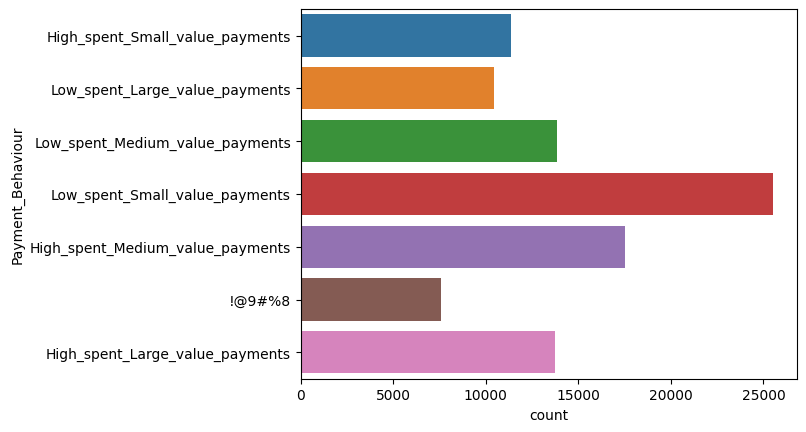

In [ ]:
#vizualizacija distribucije za payment behaviour
sns.countplot(data=df,y="Payment_Behaviour")

<Axes: xlabel='count', ylabel='Occupation'>

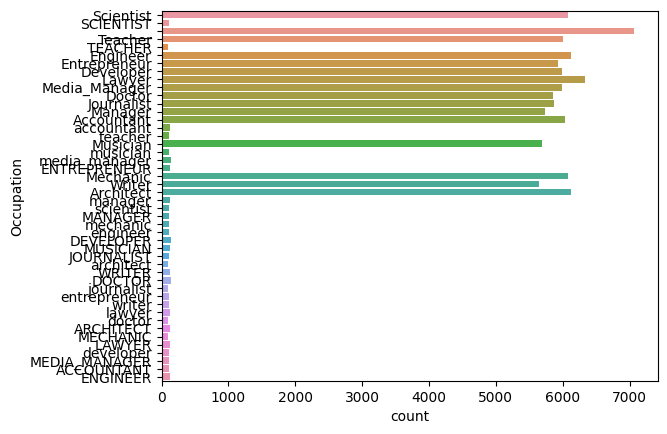

In [ ]:
#vizualizacija distribucije za occupation
sns.countplot(data=df,y="Occupation")

<Axes: xlabel='count', ylabel='Credit_Mix'>

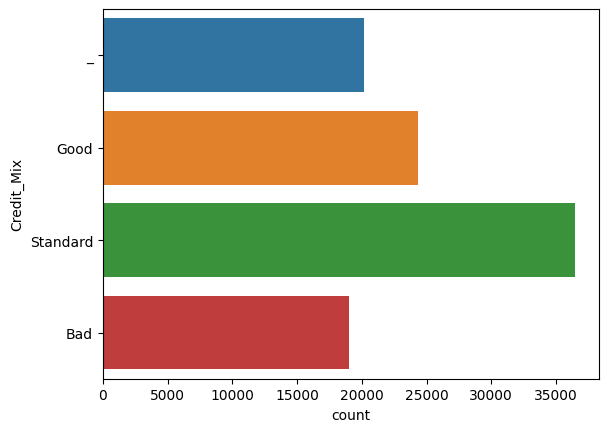

In [ ]:
#vizualizacija distribucije za credit mix
sns.countplot(data=df,y="Credit_Mix")

<Axes: xlabel='count', ylabel='Payment_of_Min_Amount'>

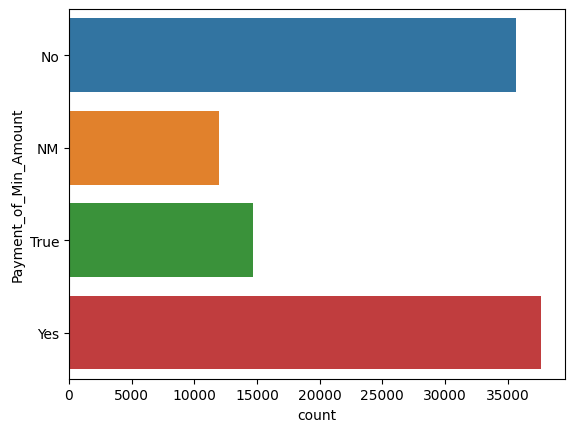

In [ ]:
#vizualizacija distribucije za payment of min amount
sns.countplot(data=df,y="Payment_of_Min_Amount")

<Axes: xlabel='count', ylabel='Credit_Score'>

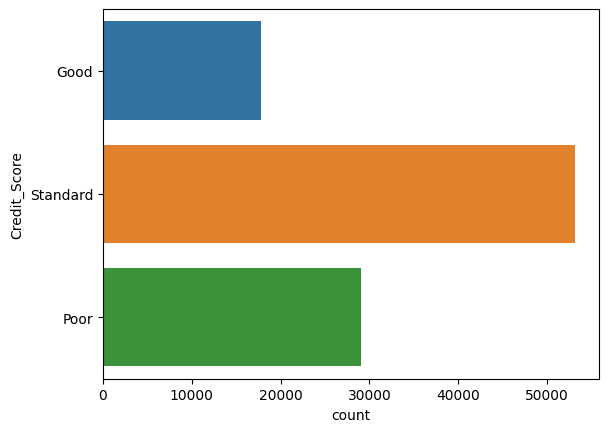

In [ ]:
#vizualizacija distribucije za credit score
sns.countplot(data=df,y="Credit_Score")

In [ ]:
# kreiranje liste varijabli koje sadrže isključivo numeričke podatke
numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']
df_numerics = df.select_dtypes(include=numerics)
df_numerics.head(5)
df_numerics.dtypes

Unnamed: 0.2                  int64
Unnamed: 0                    int64
Unnamed: 0.1                  int64
Monthly_Inhand_Salary       float64
Interest_Rate                 int64
Delay_from_due_date           int64
Num_Credit_Inquiries        float64
Credit_Utilization_Ratio    float64
Total_EMI_per_month         float64
dtype: object

In [ ]:
# srednja vrijednost za sve numericke kolone
df.mean(axis=0, numeric_only=True)

Unnamed: 0.2                50010.500000
Unnamed: 0                  49998.855802
Unnamed: 0.1                49998.855802
Monthly_Inhand_Salary        4193.959305
Interest_Rate                  72.462958
Delay_from_due_date            21.069315
Num_Credit_Inquiries           27.749776
Credit_Utilization_Ratio       32.284992
Total_EMI_per_month          1403.551424
dtype: float64

In [ ]:
# median vrijednost za sve numericke kolone
df.median(numeric_only = True)

Unnamed: 0.2                50010.500000
Unnamed: 0                  49999.500000
Unnamed: 0.1                49999.500000
Monthly_Inhand_Salary        3093.153333
Interest_Rate                  13.000000
Delay_from_due_date            18.000000
Num_Credit_Inquiries            6.000000
Credit_Utilization_Ratio       32.305645
Total_EMI_per_month            69.246684
dtype: float64

In [ ]:
# standardna devijacija za sve numericke kolone
df.std(numeric_only = True)

Unnamed: 0.2                28874.008650
Unnamed: 0                  28867.943554
Unnamed: 0.1                28867.943554
Monthly_Inhand_Salary        3183.654586
Interest_Rate                 466.380239
Delay_from_due_date            14.860541
Num_Credit_Inquiries          193.156901
Credit_Utilization_Ratio        5.116671
Total_EMI_per_month          8308.208400
dtype: float64

In [ ]:
# varijansa za sve numericke kolone (vrijedi i za varijansu i medianu)
df.var(numeric_only = True)

Unnamed: 0.2                8.337084e+08
Unnamed: 0                  8.333582e+08
Unnamed: 0.1                8.333582e+08
Monthly_Inhand_Salary       1.013566e+07
Interest_Rate               2.175105e+05
Delay_from_due_date         2.208357e+02
Num_Credit_Inquiries        3.730959e+04
Credit_Utilization_Ratio    2.618032e+01
Total_EMI_per_month         6.902633e+07
dtype: float64

In [ ]:
# deskriptivna statistika za sve numericke varijable (ukljucujuci percentile 25, 50 i 75%)
df.describe(percentiles=[.25, .5, .75])

,Unnamed: 0.2,Unnamed: 0,Unnamed: 0.1,Monthly_Inhand_Salary,Interest_Rate,Delay_from_due_date,Num_Credit_Inquiries,Credit_Utilization_Ratio,Total_EMI_per_month
count,100022.00000,100022.000000,100022.000000,85013.000000,100022.000000,100022.000000,98056.000000,100022.000000,100022.000000
mean,50010.50000,49998.855802,49998.855802,4193.959305,72.462958,21.069315,27.749776,32.284992,1403.551424
std,28874.00865,28867.943554,28867.943554,3183.654586,466.380239,14.860541,193.156901,5.116671,8308.208400
min,0.00000,0.000000,0.000000,303.645417,1.000000,-5.000000,0.000000,20.000000,0.000000
25%,25005.25000,24998.250000,24998.250000,1625.558333,8.000000,10.000000,3.000000,28.052683,30.306660
50%,50010.50000,49999.500000,49999.500000,3093.153333,13.000000,18.000000,6.000000,32.305645,69.246684
75%,75015.75000,74999.750000,74999.750000,5957.448333,20.000000,28.000000,9.000000,36.496135,161.163199
max,100021.00000,99999.000000,99999.000000,15204.633330,5797.000000,67.000000,2597.000000,50.000000,82331.000000


In [ ]:
# Karakteristika  Unnamed 0, Unnamed 0.1 i Unnamed 0.2 imaju različitu vrijednost  za svaku instancu u setu podataka, kao takve, naravno, neće uticati na predikciju.
# Brisanje kolone Unnamed: 0, Unnamed 0.1 i Unnamed 0.2
df.drop(["Unnamed: 0.2", "Unnamed: 0", "Unnamed: 0.1"], axis=1)

,ID,Customer_ID,Month,Name_and_Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,...,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
0,0x1602,CUS_0xd40,January,"Aaron Maashoh,23",821-00-0265,Scientist,19114.12,1824.843333,3,4,...,_,809.98,26.822620,22 Years and 1 Months,No,49.574949,80.41529544,High_spent_Small_value_payments,312.4940887,Good
1,0x1603,CUS_0xd40,February,"Aaron Maashoh,23",821-00-0265,Scientist,19114.12,NaN,3,4,...,Good,809.98,31.944960,NaN,No,49.574949,118.2802216,Low_spent_Large_value_payments,284.6291625,Good
2,0x1604,CUS_0xd40,3,"Aaron Maashoh,-500",821-00-0265,Scientist,19114.12,NaN,3,4,...,Good,809.98,28.609352,22 Years and 3 Months,No,49.574949,81.69952126,Low_spent_Medium_value_payments,331.2098629,Good
3,0x1605,CUS_0xd40,April,"Aaron Maashoh,23",821-00-0265,Scientist,19114.12,NaN,3,4,...,Good,809.98,31.377862,22 Years and 4 Months,No,49.574949,199.4580744,Low_spent_Small_value_payments,223.4513097,Good
4,0x1606,CUS_0xd40,May,"Aaron Maashoh,23",821-00-0265,SCIENTIST,19114.12,1824.843333,3,4,...,Good,809.98,24.797347,22 Years and 5 Months,No,49.574949,41.42015309,High_spent_Medium_value_payments,341.489231,Good
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
100017,0x25fe9,CUS_0x942c,April,"Nicks,25",078-73-5990,Mechanic,39628.99,3359.415833,4,6,...,_,502.38,34.663572,31 Years and 6 Months,No,35.104023,60.97133256,High_spent_Large_value_payments,479.866228,Poor
100018,0x25fea,CUS_0x942c,May,"Nicks,25",078-73-5990,Mechanic,39628.99,3359.415833,4,6,...,_,502.38,40.565631,31 Years and 7 Months,No,35.104023,54.18595029,High_spent_Medium_value_payments,496.65161,Poor
100019,0x25feb,CUS_0x942c,6,"Nicks,25",078-73-5990,Mechanic,39628.99,3359.415833,4,6 cards,...,Good,502.38,41.255522,31 Years and 8 Months,No,35.104023,24.02847745,High_spent_Large_value_payments,516.809083,Poor
100020,0x25fec,CUS_0x942c,July,"Nicks,25",078-73-5990,Mechanic,39628.99,3359.415833,4,6,...,Good,502.38,33.638208,31 Years and 9 Months,No,35.104023,251.6725822,Low_spent_Large_value_payments,319.164979,Standard


<Axes: >

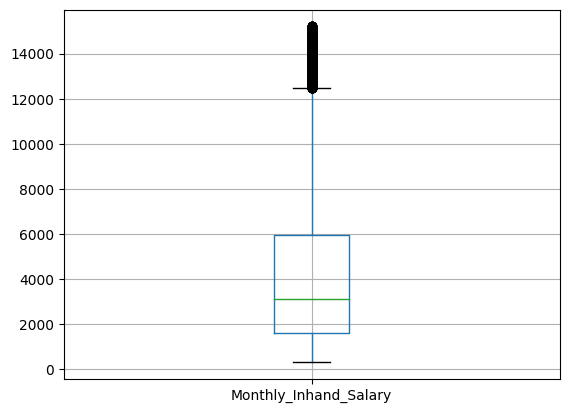

In [ ]:
df.boxplot(column="Monthly_Inhand_Salary")

<Axes: >

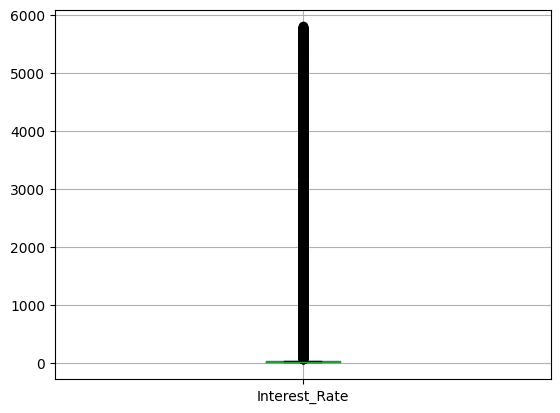

In [ ]:
df.boxplot(column="Interest_Rate")

<Axes: >

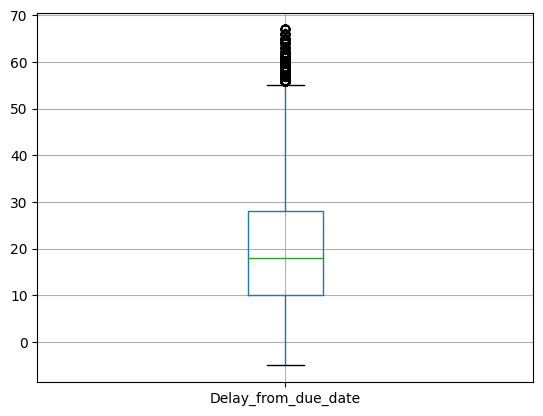

In [ ]:
df.boxplot(column="Delay_from_due_date")

<Axes: >

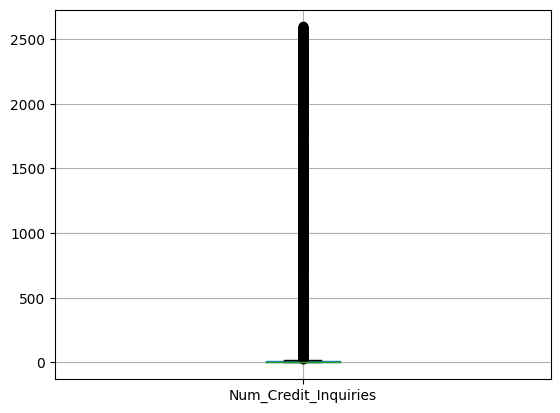

In [ ]:
df.boxplot(column="Num_Credit_Inquiries")

<Axes: >

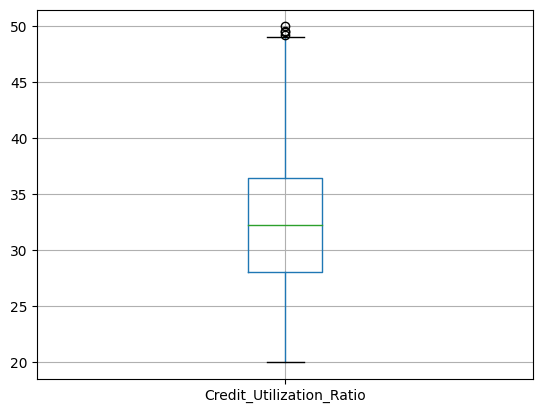

In [ ]:
df.boxplot(column="Credit_Utilization_Ratio")

<Axes: >

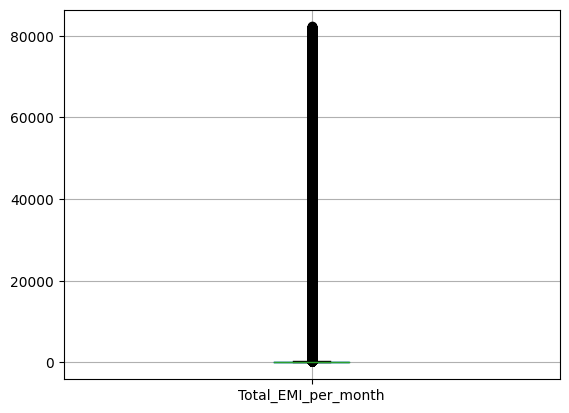

In [ ]:
df.boxplot(column="Total_EMI_per_month")

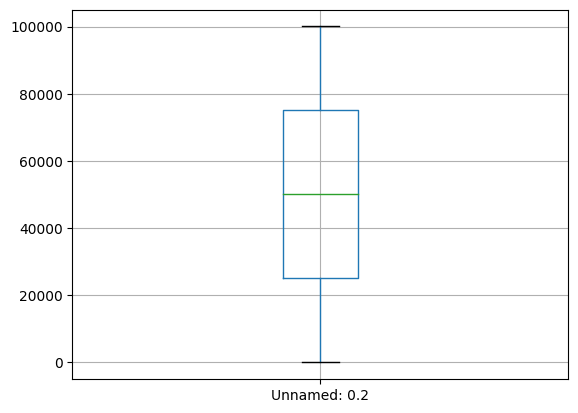

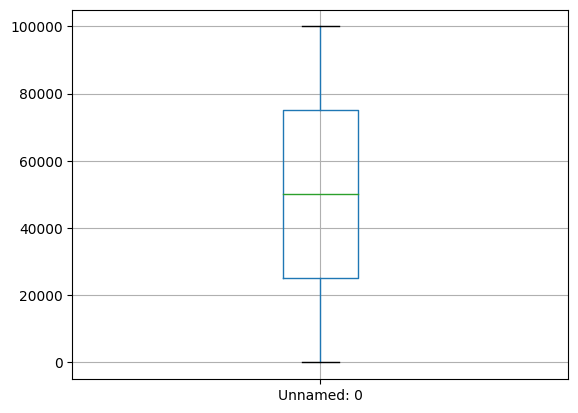

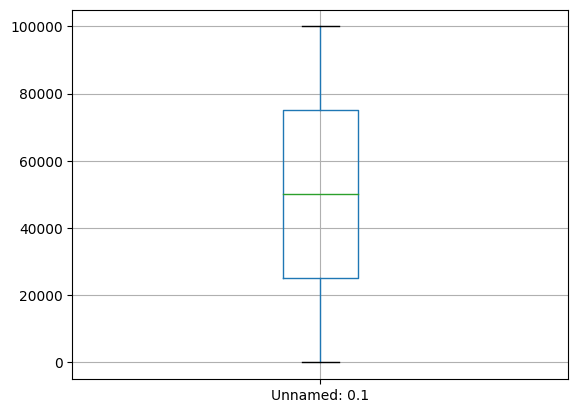

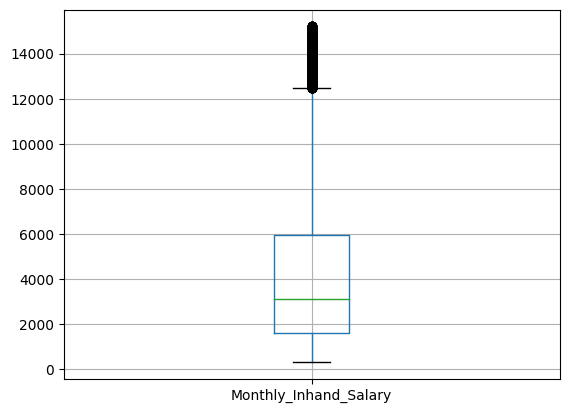

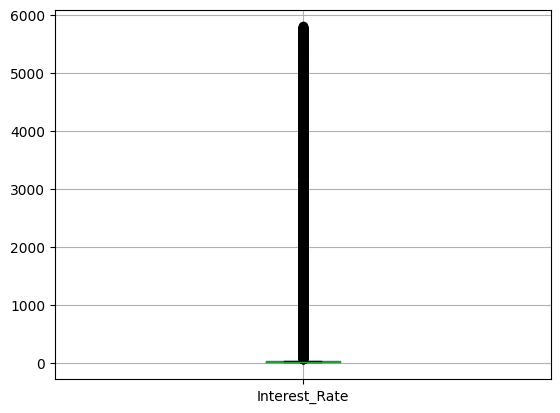

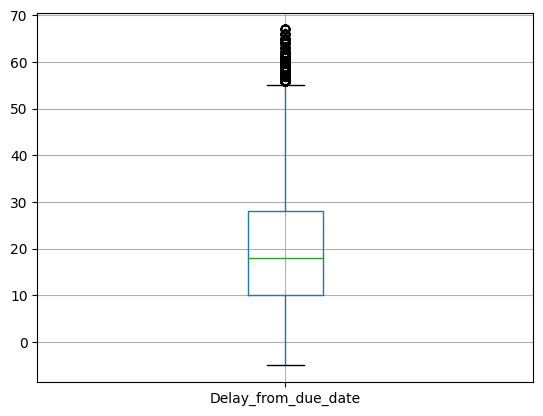

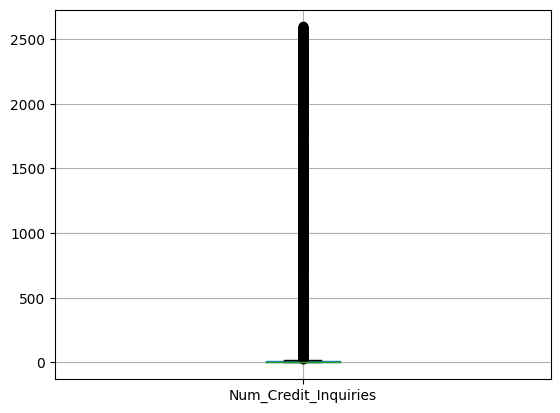

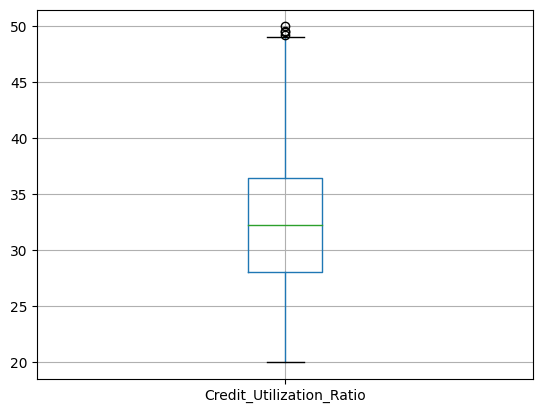

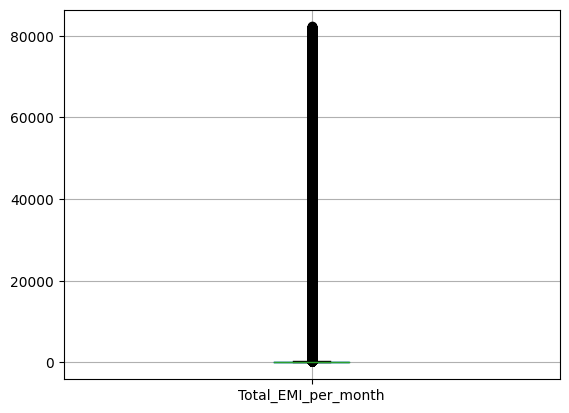

In [ ]:
# boxplotovi za sve numericke varijable
import matplotlib.pyplot as plt
for col in df_numerics:
    plt.figure()
    df.boxplot([col])

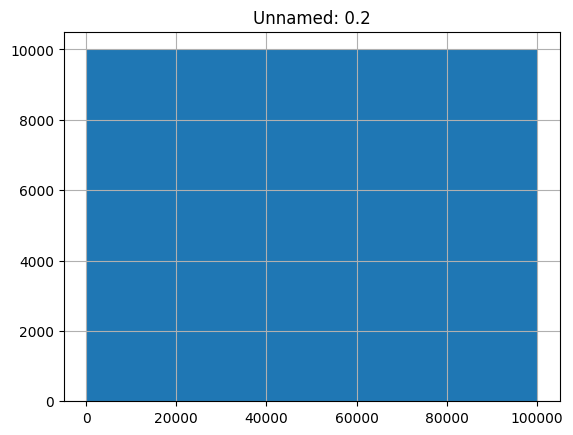

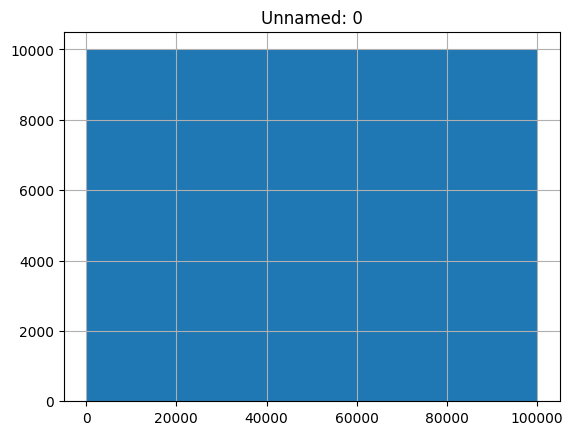

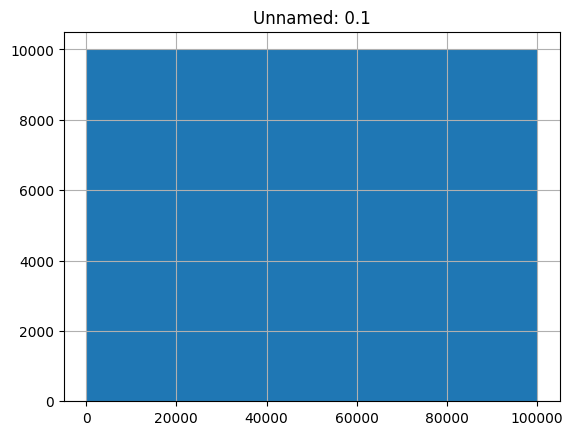

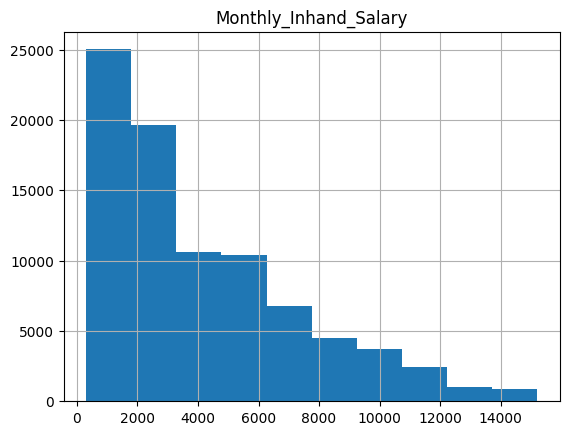

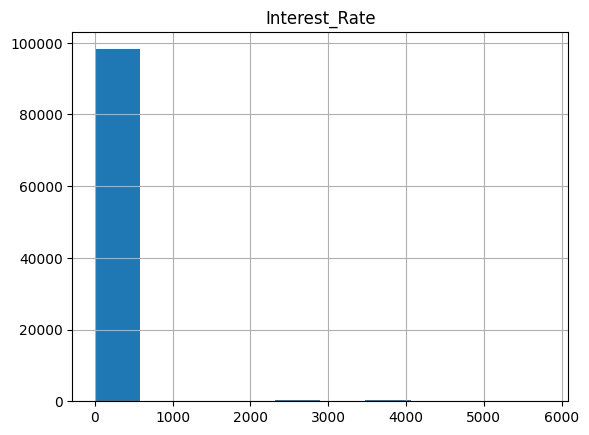

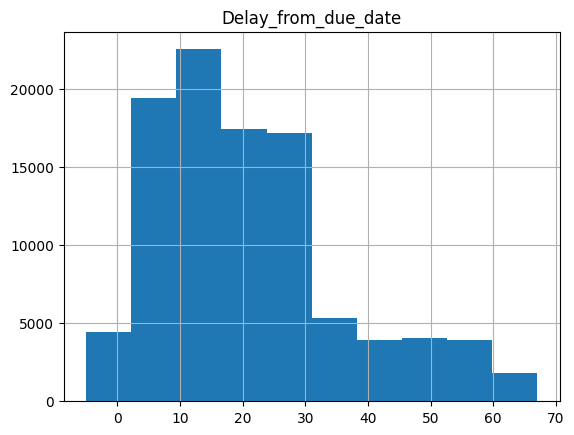

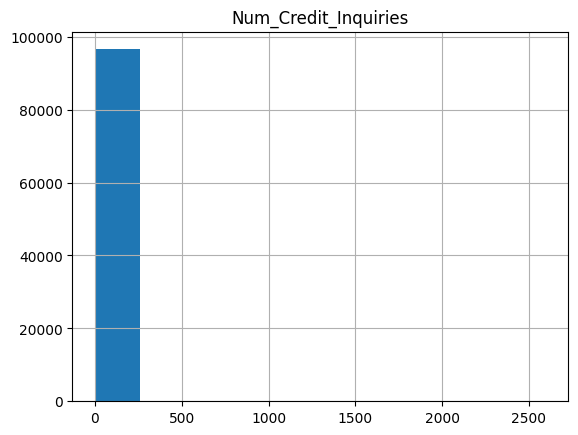

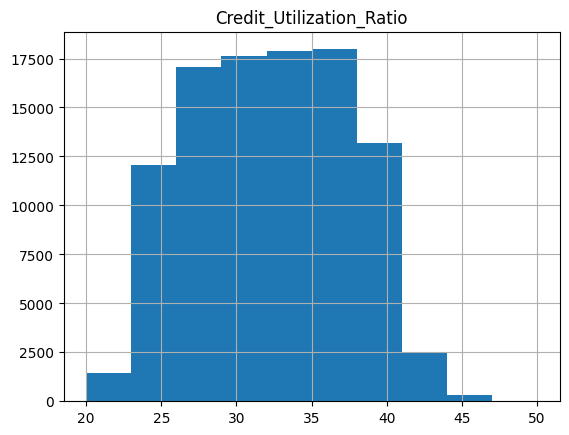

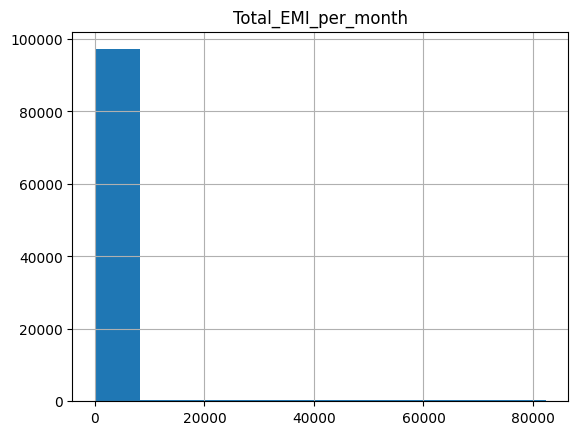

In [ ]:
# prikaz distribucije pomocu histograma za sve numericke kolone
for col in df_numerics:
    plt.figure()
    plt.title(col)
    df[col].hist()

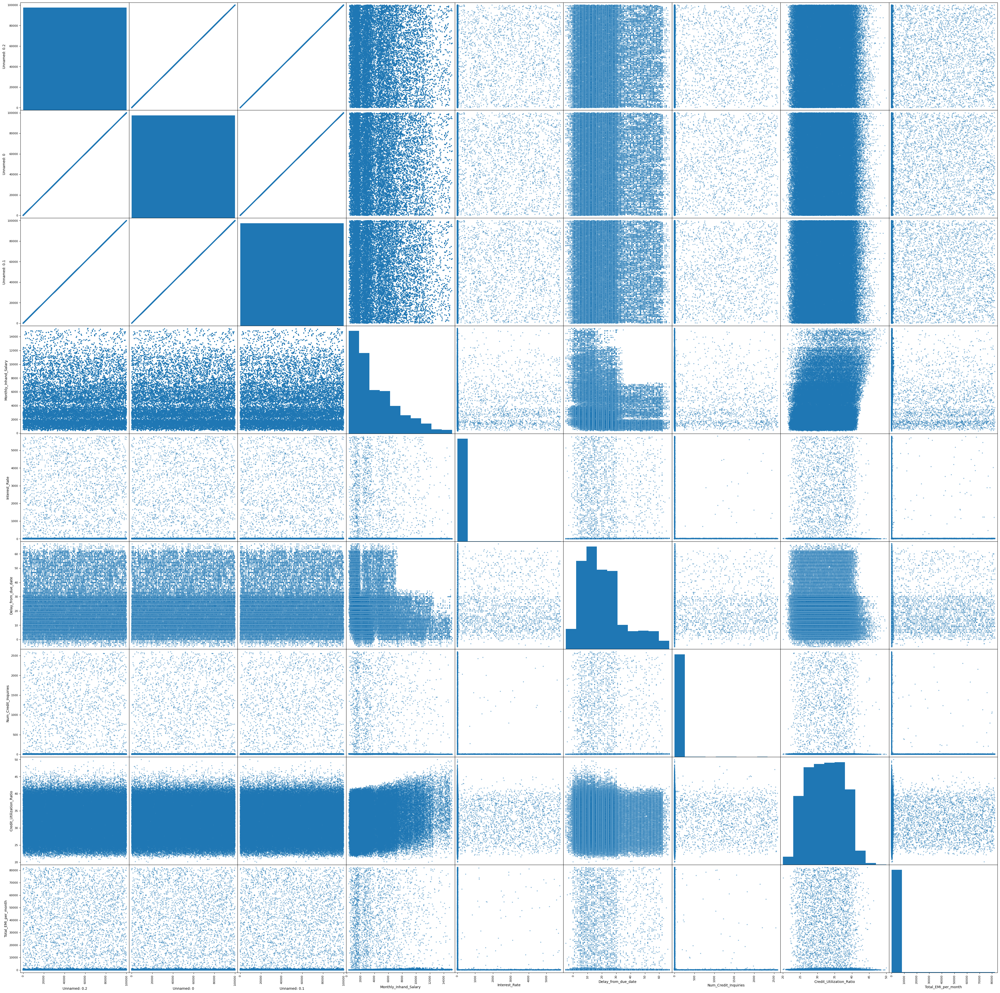

In [ ]:
# prikaz matrice scatter plotova svih kombinacija numerickih varijabli u setu podataka
# na dijagonali su histogrami pojedinacnih varijabli
from pandas.plotting import scatter_matrix
scatter_matrix(df, figsize=(50,50))
plt.show()

In [ ]:
# matrica kovarijance
CovMatrix = pd.DataFrame.cov(df)
print(CovMatrix)

                          Unnamed: 0.2    Unnamed: 0  Unnamed: 0.1  \
Unnamed: 0.2              8.337084e+08  8.335333e+08  8.335333e+08   
Unnamed: 0                8.335333e+08  8.333582e+08  8.333582e+08   
Unnamed: 0.1              8.335333e+08  8.333582e+08  8.333582e+08   
Monthly_Inhand_Salary    -4.888890e+05 -4.887753e+05 -4.887753e+05   
Interest_Rate             5.286713e+04  5.285653e+04  5.285653e+04   
Delay_from_due_date      -2.104251e+03 -2.103913e+03 -2.103913e+03   
Num_Credit_Inquiries      3.160064e+04  3.159387e+04  3.159387e+04   
Credit_Utilization_Ratio -7.921670e+02 -7.920088e+02 -7.920088e+02   
Total_EMI_per_month      -1.050586e+05 -1.050228e+05 -1.050228e+05   

                          Monthly_Inhand_Salary  Interest_Rate  \
Unnamed: 0.2                      -4.888890e+05   52867.130962   
Unnamed: 0                        -4.887753e+05   52856.532161   
Unnamed: 0.1                      -4.887753e+05   52856.532161   
Monthly_Inhand_Salary              

<ipython-input-33-01300aa973b4>:2: FutureWarning: The default value of numeric_only in DataFrame.cov is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  CovMatrix = pd.DataFrame.cov(df)


In [ ]:
# matrica korelacije
CorrMatrix=pd.DataFrame.corr(df)
print(CorrMatrix)

                          Unnamed: 0.2  Unnamed: 0  Unnamed: 0.1  \
Unnamed: 0.2                  1.000000    1.000000      1.000000   
Unnamed: 0                    1.000000    1.000000      1.000000   
Unnamed: 0.1                  1.000000    1.000000      1.000000   
Monthly_Inhand_Salary        -0.005318   -0.005318     -0.005318   
Interest_Rate                 0.003926    0.003926      0.003926   
Delay_from_due_date          -0.004904   -0.004904     -0.004904   
Num_Credit_Inquiries          0.005668    0.005668      0.005668   
Credit_Utilization_Ratio     -0.005362   -0.005362     -0.005362   
Total_EMI_per_month          -0.000438   -0.000438     -0.000438   

                          Monthly_Inhand_Salary  Interest_Rate  \
Unnamed: 0.2                          -0.005318       0.003926   
Unnamed: 0                            -0.005318       0.003926   
Unnamed: 0.1                          -0.005318       0.003926   
Monthly_Inhand_Salary                  1.000000      -0

<ipython-input-34-39ebc908dd62>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  CorrMatrix=pd.DataFrame.corr(df)


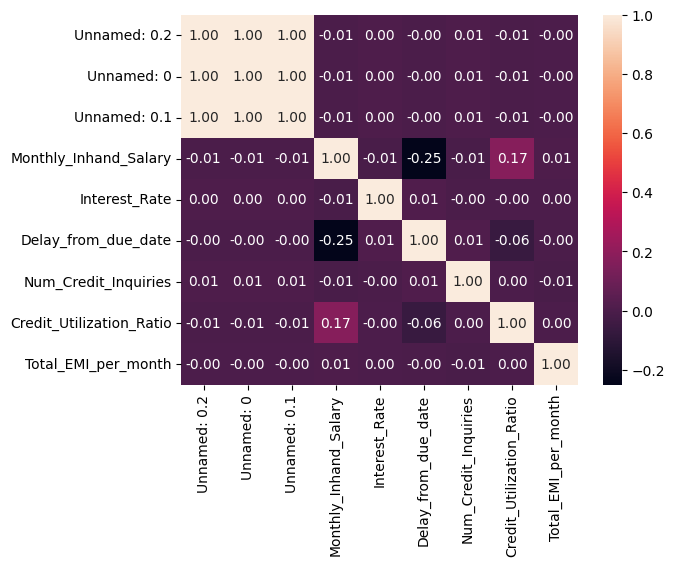

In [ ]:
# heatmap
import seaborn as sns
sns.heatmap(CorrMatrix, annot = True, fmt = '.2f')
plt.show()

In [ ]:
df['Payment_Behaviour'].unique()

array(['High_spent_Small_value_payments',
       'Low_spent_Large_value_payments',
       'Low_spent_Medium_value_payments',
       'Low_spent_Small_value_payments',
       'High_spent_Medium_value_payments', '!@9#%8',
       'High_spent_Large_value_payments'], dtype=object)

**Opis varijabli:**


**1.   Unnamed: 0**

Tip varijable: int64

Namjena: UNKNOWN

Moguće vrijednosti: UNLIMITED

Outlier: NONE

Distribucija: Ravnomjerna

Smaknutost: NOT SUPPORTED TYPE
  

**2.   Unnamed: 0.1**

Tip varijable: int64

Namjena: UNKNOWN

Moguće vrijednosti: UNLIMITED

Outlier: NONE

Distribucija: Ravnomjerna

Smaknutost: NOT SUPPORTED TYPE
                 

 **3.   Unnamed: 0.1.1**

Tip varijable: int64

Namjena: UNKNOWN

Moguće vrijednosti: UNLIMITED

Outlier: NONE

Distribucija: Ravnomjerna

Smaknutost: NOT SUPPORTED TYPE
               


**4.   ID**

Tip varijable: object

Namjena: Identifikator u datasetu

Moguće vrijednosti: UNLIMITED

Outlier: NONE

Distribucija: NOT SUPPORTED TYPE

Smaknutost: NOT SUPPORTED TYPE
                         

**5.   Customer_ID**

Tip varijable: object

Namjena: Identifikator svakog kupca/klijenta

Moguće vrijednosti: UNLIMITED

Outlier: NONE

Distribucija: NOT SUPPORTED TYPE

Smaknutost: NOT SUPPORTED TYPE
                 

**6.   Month**


Tip varijable: object

Namjena: Mjesec

Moguće vrijednosti: [January, February, 3, April, May, 6, July, 8]

Outlier: NONE

Distribucija: NOT SUPPORTED TYPE

Smaknutost: NOT SUPPORTED TYPE
                       

**7.   Name_and_Age**


Tip varijable: object

Namjena: Ime i starost klijenta

Moguće vrijednosti: UNLIMITED

Outlier: NONE

Distribucija: NOT SUPPORTED TYPE

Smaknutost: NOT SUPPORTED TYPE
                

**8.   SSN**


Tip varijable: object

Namjena: Broj socijalnog osiguranja (eng. *Social Security Number*)

Moguće vrijednosti: UNLIMITED

Outlier: NONE

Distribucija: NOT SUPPORTED TYPE

Smaknutost: NOT SUPPORTED TYPE



**9.   Occupation**


Tip varijable: object

Namjena: Zanimanje

Moguće vrijednosti: [*'Scientist' 'SCIENTIST' '_______' 'Teacher' 'TEACHER'
'Engineer'
 'Entrepreneur' 'Developer' 'Lawyer' 'Media_Manager' 'Doctor' 'Journalist'
 'Manager' 'Accountant' 'accountant' 'teacher' 'Musician' 'musician'
 'media_manager' 'ENTREPRENEUR' 'Mechanic' 'Writer' 'Architect' 'manager'
 'scientist' 'MANAGER' 'mechanic' 'engineer' 'DEVELOPER' 'MUSICIAN'
 'JOURNALIST' 'architect' 'WRITER' 'DOCTOR' 'journalist' 'entrepreneur'
 'writer' 'lawyer' 'doctor' 'ARCHITECT' 'MECHANIC' 'LAWYER' 'developer'
 'MEDIA_MANAGER' 'ACCOUNTANT' 'ENGINEER'*]

Outlier: NONE

Distribucija: Potrebne tranformacije

Smaknutost: NOT SUPPORTED TYPE


**10.   Annual_Income**


Tip varijable: object

Namjena: Godinšnji prihod

Moguće vrijednosti: UNLIMITED

Outlier: NONE

Distribucija: NOT SUPPORTED TYPE

Smaknutost: NOT SUPPORTED TYPE



**11.  Monthly_Inhand_Salary**



Tip varijable: float64

Namjena: Plata nakon odbijanja poreza/taxe

Moguće vrijednosti: UNLIMITED

Outlier: Veliki broj prelazi 12000

Distribucija: Na osnovu histograma se vidi da većina klijenata ima platu između
otprilike 100 i 3500.

Smaknutost: Ulijevo smaknuta
      

**12.  Num_Bank_Accounts**


Tip varijable: object

Namjena: Količina bankovnih računa

Moguće vrijednosti: UNLIMITED

Outlier: NONE

Distribucija: NOT SUPPORTED TYPE

Smaknutost: NOT SUPPORTED TYPE


**13.  Num_Credit_Card**


Tip varijable: object

Namjena: Količina kreditnih kartica

Moguće vrijednosti: UNLIMITED

Outlier: NONE

Distribucija: NOT SUPPORTED TYPE

Smaknutost: NOT SUPPORTED TYPE


**14.  Interest_Rate**


Tip varijable: int64

Namjena: Kamata

Moguće vrijednosti: UNLIMITED

Outlier: Veliki broj outliera

Distribucija: Na osnovu histograma se vidi da većina klijenata ima kamatu do 500.

Smaknutost: Visoko smaknuta ulijevo
                

**15.  Num_of_Loan**


Tip varijable: object

Namjena: Broj zajmova

Moguće vrijednosti: UNLIMITED

Outlier: NONE

Distribucija: NOT SUPPORTED TYPE

Smaknutost: NOT SUPPORTED TYPE


**16.  Type_of_Loan**


Tip varijable: object

Namjena: Tip zajma

Moguće vrijednosti: UNLIMITED

Outlier: NONE

Distribucija: NOT SUPPORTED TYPE

Smaknutost: NOT SUPPORTED TYPE
                

**17.  Delay_from_due_date**


Tip varijable: int64

Namjena: Odgoda od roka

Moguće vrijednosti: UNLIMITED

Outlier: Nekoliko podataka prelazi 50

Distribucija: Na osnovu histograma se vidi da većina klijenata ima OVAJ
PARAMETAR između 3 i 30.

Smaknutost: Blago smaknuta ulijevo
          

**18.  Num_of_Delayed_Payment**


Tip varijable: object

Namjena: Broj odgođene isplate

Moguće vrijednosti: UNLIMITED

Outlier: NONE

Distribucija: NOT SUPPORTED TYPE

Smaknutost: NOT SUPPORTED TYPE
       

**19.  Changed_Credit_Limit**


Tip varijable: object

Namjena: Izmjenjeni kreditni limit

Moguće vrijednosti: UNLIMITED

Outlier: NONE

Distribucija: NOT SUPPORTED TYPE

Smaknutost: NOT SUPPORTED TYPE
        

**20.  Num_Credit_Inquiries**


Tip varijable: float64

Namjena: Broj kreditnih upita/zahtjeva

Moguće vrijednosti: UNLIMITED

Outlier: Veliki broj outliera

Distribucija: Na osnovu histograma se vidi da većina klijenata ima OVAJ
PARAMETAR između 0 i 250.

Smaknutost: Visoko smaknuta ulijevo
       

**21.  Credit_Mix**


Tip varijable: object

Namjena: Koliko dobro klijent isplaćuje različite vrste kredita

Moguće vrijednosti: [_, Good, Standard, Bad]

Outlier: NONE

Distribucija: Ravnomjerna

Smaknutost: NOT SUPPORTED TYPE
                  

**22.  Outstanding_Debt**


Tip varijable: object

Namjena: Iznos duga

Moguće vrijednosti: UNLIMITED

Outlier: NONE

Distribucija: NOT SUPPORTED TYPE

Smaknutost: NOT SUPPORTED TYPE
            

**23.  Credit_Utilization_Ratio**



Tip varijable: float64

Namjena: UNKNOWN

Moguće vrijednosti: UNLIMITED

Outlier: Nekoliko podataka prelazi 45

Distribucija: Na osnovu histograma se vidi da većina klijenata ima OVAJ PARAMETAR između 20 i 45.

Smaknutost: Nije smaknuta
   

**24.  Credit_History_Age**



Tip varijable: object

Namjena: Koliko dugo je račun klijenta otvoren

Moguće vrijednosti: UNLIMITED

Outlier: NONE


Distribucija: NOT SUPPORTED TYPE

Smaknutost: NOT SUPPORTED TYPE



**25.  Payment_of_Min_Amount**


Tip varijable: object

Namjena: Najmanja moguća isplata

Moguće vrijednosti: [No, NM, True, Yes]

Outlier: NONE

Distribucija: NM odstupa

Smaknutost: NOT SUPPORTED TYPE
       

**26.  Total_EMI_per_month**


Tip varijable: float64

Namjena: Iznos novca koji se plaća svakog mjeseca

Moguće vrijednosti: UNLIMITED

Outlier: Veliki broj outliera

Distribucija: Na osnovu histograma se vidi da većina klijenata ima OVAJ
PARAMETAR između 0 i 7000.

Smaknutost: Visoko smaknuta ulijevo
        

**27.  Amount_invested_monthly**


Tip varijable: object

Namjena: Količina novca uložena mjesečno

Moguće vrijednosti: UNLIMITED

Outlier: NONE

Distribucija: NOT SUPPORTED TYPE

Smaknutost: NOT SUPPORTED TYPE
     

**28.  Payment_Behaviour**

Tip varijable: object

Namjena: Način na koji se isplaćuje dug

Moguće vrijednosti: ['High_spent_Small_value_payments',
       'Low_spent_Large_value_payments',
       'Low_spent_Medium_value_payments',
       'Low_spent_Small_value_payments',
       'High_spent_Medium_value_payments', '!@9#%8',
       'High_spent_Large_value_payments', nan]

Outlier: NONE

Distribucija: Ravnomjerna, dominira low_spent, small_value

Smaknutost: NOT SUPPORTED TYPE
           

**29.  Monthly_Balance**


Tip varijable: object

Namjena: Mjesečni balans

Moguće vrijednosti: UNLIMITED

Outlier: NONE

Distribucija: NOT SUPPORTED TYPE

Smaknutost: NOT SUPPORTED TYPE
             

**30.  Credit_Score**


Tip varijable: object

Namjena: Kreditna sposobnost

Moguće vrijednosti: [Good, Standard, Poor]

Outlier: NONE

Distribucija: Standard dominira

Smaknutost: NOT SUPPORTED TYPE

**1.3.**

*Razdvajamo kolonu Name_and_Age na dvije kolone, Name i Age, zbog drugacijeg tipa podataka*

In [ ]:
df1 = df

In [ ]:

df1['Name_and_Age'].unique()
df1[["Name","Age"]]=df1.Name_and_Age.str.split(",",1,expand=True)


<ipython-input-38-476638189b13>:2: FutureWarning: In a future version of pandas all arguments of StringMethods.split except for the argument 'pat' will be keyword-only.
  df1[["Name","Age"]]=df1.Name_and_Age.str.split(",",1,expand=True)


In [ ]:
df1['Name']=df1['Name'].fillna(df1.groupby('Customer_ID')['Name'].transform(lambda x: x.mode()[0]))

In [ ]:
df1['Name']

0         Aaron Maashoh
1         Aaron Maashoh
2         Aaron Maashoh
3         Aaron Maashoh
4         Aaron Maashoh
              ...      
100017            Nicks
100018            Nicks
100019            Nicks
100020            Nicks
100021            Nicks
Name: Name, Length: 100022, dtype: object

In [ ]:
df1['Age']

0           23
1           23
2         -500
3           23
4           23
          ... 
100017      25
100018      25
100019      25
100020      25
100021      25
Name: Age, Length: 100022, dtype: object

In [ ]:
df1['Age']=df1['Age'].apply(lambda x: int(''.join(filter(str.isdigit, str(x)))) if pd.notnull(x) else 0)


In [ ]:
df1['Age']

0          23
1          23
2         500
3          23
4          23
         ... 
100017     25
100018     25
100019     25
100020     25
100021     25
Name: Age, Length: 100022, dtype: int64

In [ ]:
df1['Age'].describe()

count    100022.000000
mean        108.712253
std         656.111232
min           0.000000
25%          22.000000
50%          31.000000
75%          41.000000
max        8698.000000
Name: Age, dtype: float64

In [ ]:
df1.loc[(df1['Age']<18) | (df1['Age']>100),'Age']=np.nan

In [ ]:
df1['Age']

0         23.0
1         23.0
2          NaN
3         23.0
4         23.0
          ... 
100017    25.0
100018    25.0
100019    25.0
100020    25.0
100021    25.0
Name: Age, Length: 100022, dtype: float64

In [ ]:
df1['Age'] = df1.groupby("Customer_ID")['Age'].apply(lambda x: x.fillna(x.median()) if not pd.isna(x.median()) else x.fillna(df['Age'].median()))

/usr/local/lib/python3.10/dist-packages/numpy/lib/nanfunctions.py:1215: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/usr/local/lib/python3.10/dist-packages/numpy/lib/nanfunctions.py:1215: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/usr/local/lib/python3.10/dist-packages/numpy/lib/nanfunctions.py:1215: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/usr/local/lib/python3.10/dist-packages/numpy/lib/nanfunctions.py:1215: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/usr/local/lib/python3.10/dist-packages/numpy/lib/nanfunctions.py:1215: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/usr/local/lib/python3.10/dist-packages/numpy/lib/nanfunctions.py:1215: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/usr/local

In [ ]:
df1['Age'].unique()

array([ 23. ,  28. ,  34. ,  54. ,  55. ,  21. ,  31. ,  33. ,  30. ,
        24. ,  44. ,  45. ,  40. ,  41. ,  32. ,  35. ,  36. ,  39. ,
        37. ,  20. ,  46. ,  26. ,  42. ,  48. ,  38. ,  43. ,  22. ,
        19. ,  18. ,  18.5,  27. ,  25. ,  46.5,  47. ,  53. ,  56. ,
        29. ,  49. ,  22.5,  51. ,  50. ,  33.5,  52. ,  26.5,  21.5,
        31.5,  49.5,  43.5,  35.5,  27.5,  23.5,  30.5,  42.5,  39.5,
        20.5,  48.5,  34.5,  45.5,  52.5,  44.5,  37.5,  41.5,  29.5,
        25.5,  24.5,  40.5,  54.5,  38.5,  19.5,  99. , 100. ,  32.5,
        28.5,  55.5,  36.5,  51.5,  95. ,  53.5,  50.5,  47.5])

In [ ]:
df1=df1.drop(columns='Name_and_Age')

***Sada slijedi transformacija kategorickih vrijednosti***

# **ID**

In [ ]:
df1['ID'].unique()

array(['0x1602', '0x1603', '0x1604', ..., '0x25feb', '0x25fec', '0x25fed'],
      dtype=object)

# **Customer_ID**

In [ ]:
df1['Customer_ID'].unique()

array(['CUS_0xd40', 'CUS_0x21b1', 'CUS_0x2dbc', ..., 'CUS_0xaf61',
       'CUS_0x8600', 'CUS_0x942c'], dtype=object)

# **Month**

In [ ]:
df1['Month'].unique()

array(['January', 'February', '3', 'April', 'May', '6', 'July', '8'],
      dtype=object)

In [ ]:
df1.loc[df1["Month"] == "3", "Month"] = "March"
df1.loc[df1["Month"] == "6", "Month"] = "June"
df1.loc[df1["Month"] == "8", "Month"] = "August"
df1['Month'].unique()

array(['January', 'February', 'March', 'April', 'May', 'June', 'July',
       'August'], dtype=object)

# **SSN**

In [ ]:
df1['SSN'].unique()

array(['821-00-0265', '#F%$D@*&8', '004-07-5839', ..., '133-16-7738',
       '031-35-0942', '078-73-5990'], dtype=object)

In [ ]:
df1.loc[df1["SSN"] == "#F%$D@*&8", "SSN"] = 0

In [ ]:
df1['SSN'].unique()

array(['821-00-0265', 0, '004-07-5839', ..., '133-16-7738', '031-35-0942',
       '078-73-5990'], dtype=object)

In [ ]:
df1['SSN'].describe()

count     100022
unique     12501
top            0
freq        5576
Name: SSN, dtype: int64

# **Occupation**

In [ ]:
df1['Occupation'].unique()

array(['Scientist', 'SCIENTIST', '_______', 'Teacher', 'TEACHER',
       'Engineer', 'Entrepreneur', 'Developer', 'Lawyer', 'Media_Manager',
       'Doctor', 'Journalist', 'Manager', 'Accountant', 'accountant',
       'teacher', 'Musician', 'musician', 'media_manager', 'ENTREPRENEUR',
       'Mechanic', 'Writer', 'Architect', 'manager', 'scientist',
       'MANAGER', 'mechanic', 'engineer', 'DEVELOPER', 'MUSICIAN',
       'JOURNALIST', 'architect', 'WRITER', 'DOCTOR', 'journalist',
       'entrepreneur', 'writer', 'lawyer', 'doctor', 'ARCHITECT',
       'MECHANIC', 'LAWYER', 'developer', 'MEDIA_MANAGER', 'ACCOUNTANT',
       'ENGINEER'], dtype=object)

In [ ]:
df1.loc[df1["Occupation"] == "SCIENTIST", "Occupation"] = "Scientist"
df1.loc[df1["Occupation"] == "scientist", "Occupation"] = "Scientist"
df1.loc[df1["Occupation"] == "TEACHER", "Occupation"] = "Teacher"
df1.loc[df1["Occupation"] == "teacher", "Occupation"] = "Teacher"
df1.loc[df1["Occupation"] == "ENGINEER", "Occupation"] = "Engineer"
df1.loc[df1["Occupation"] == "engineer", "Occupation"] = "Engineer"
df1.loc[df1["Occupation"] == "ENTREPRENEUR", "Occupation"] = "Entrepreneur"
df1.loc[df1["Occupation"] == "entrepreneur", "Occupation"] = "Entrepreneur"
df1.loc[df1["Occupation"] == "DEVELOPER", "Occupation"] = "Developer"
df1.loc[df1["Occupation"] == "developer", "Occupation"] = "Developer"
df1.loc[df1["Occupation"] == "LAWYER", "Occupation"] = "Lawyer"
df1.loc[df1["Occupation"] == "lawyer", "Occupation"] = "Lawyer"
df1.loc[df1["Occupation"] == "MEDIA_MANAGER", "Occupation"] = "Media_Manager"
df1.loc[df1["Occupation"] == "media_manager", "Occupation"] = "Media_Manager"
df1.loc[df1["Occupation"] == "DOCTOR", "Occupation"] = "Doctor"
df1.loc[df1["Occupation"] == "doctor", "Occupation"] = "Doctor"
df1.loc[df1["Occupation"] == "JOURNALIST", "Occupation"] = "Journalist"
df1.loc[df1["Occupation"] == "journalist", "Occupation"] = "Journalist"
df1.loc[df1["Occupation"] == "MUSICIAN", "Occupation"] = "Musician"
df1.loc[df1["Occupation"] == "musician", "Occupation"] = "Musician"
df1.loc[df1["Occupation"] == "MANAGER", "Occupation"] = "Manager"
df1.loc[df1["Occupation"] == "manager", "Occupation"] = "Manager"
df1.loc[df1["Occupation"] == "ACCOUNTANT", "Occupation"] = "Accountant"
df1.loc[df1["Occupation"] == "accountant", "Occupation"] = "Accountant"
df1.loc[df1["Occupation"] == "ARCHITECT", "Occupation"] = "Architect"
df1.loc[df1["Occupation"] == "architect", "Occupation"] = "Architect"
df1.loc[df1["Occupation"] == "WRITER", "Occupation"] = "Writer"
df1.loc[df1["Occupation"] == "writer", "Occupation"] = "Writer"
df1.loc[df1["Occupation"] == "MECHANIC", "Occupation"] = "Mechanic"
df1.loc[df1["Occupation"] == "mechanic", "Occupation"] = "Mechanic"
df1.loc[df1["Occupation"] == "_______", "Occupation"] = "Unknown"
df1['Occupation'].unique()

array(['Scientist', 'Unknown', 'Teacher', 'Engineer', 'Entrepreneur',
       'Developer', 'Lawyer', 'Media_Manager', 'Doctor', 'Journalist',
       'Manager', 'Accountant', 'Musician', 'Mechanic', 'Writer',
       'Architect'], dtype=object)

# **Annual_Income**

In [ ]:
df1['Annual_Income'].unique()

array(['19114.12', '34847.84', '34847.84_', ..., '20002.88', '39628.99',
       '39628.99_'], dtype=object)

In [ ]:
df1['Annual_Income'] = df1['Annual_Income'].str.replace('_', '', regex=True).str.strip()

In [ ]:
df1['Annual_Income'] = df1["Annual_Income"].astype(float)

In [ ]:
df1['Annual_Income'].unique()

array([ 19114.12,  34847.84, 143162.64, ...,  37188.1 ,  20002.88,
        39628.99])

In [ ]:
df1['Annual_Income'].describe()

count    1.000220e+05
mean     1.763843e+05
std      1.429462e+06
min      7.005930e+03
25%      1.945549e+04
50%      3.757861e+04
75%      7.278306e+04
max      2.419806e+07
Name: Annual_Income, dtype: float64

# **Num_Bank_Accounts**

In [ ]:
df1['Num_Bank_Accounts'].unique()

array(['3', '2', '1', '7', '7 accounts', '4', '4 accounts', '0', '8',
       '1 accounts', '5', '3 accounts', '6 accounts', '6', '5 accounts',
       '9', '9 accounts', '10', '1414', '1231', '67', '572', '1488',
       '2 accounts', '8 accounts', '10 accounts', '0 accounts', '91',
       '528', '1647', '1696', '1338', '649', '889', '1668', '685', '857',
       '975', '1496', '1534', '1620', '37', '1388', '1429', '1332',
       '1588', '120', '1777', '1096', '803', '494', '744', '1139', '831',
       '1613', '741', '121', '665', '1748 accounts', '1644', '823',
       '1356', '1651', '87', '711', '450', '210', '1671', '1722', '648',
       '672', '1662', '1495', '510', '666', '429', '1131', '1434', '980',
       '1026', '526', '718', '1300', '1312', '1315', '501',
       '1566 accounts', '480', '1042', '322', '628', '1016', '333',
       '1265', '791', '427', '563', '905', '1190', '1036', '1611', '38',
       '619', '555', '1769', '280', '752', '1201', '812', '1487', '222',
       '212',

In [ ]:
df1['Num_Bank_Accounts']=df1['Num_Bank_Accounts'].replace(r' accounts', r'', regex=True)

In [ ]:
df1["Num_Bank_Accounts"].describe()

count     100022
unique       943
top            6
freq       13002
Name: Num_Bank_Accounts, dtype: object

In [ ]:
df1['Num_Bank_Accounts']=df1['Num_Bank_Accounts'].astype(int)

In [ ]:
df1['Num_Bank_Accounts'].describe()

count    100022.000000
mean         17.088880
std         117.392039
min          -1.000000
25%           3.000000
50%           6.000000
75%           7.000000
max        1798.000000
Name: Num_Bank_Accounts, dtype: float64

In [ ]:
df1['Num_Bank_Accounts'] = df1['Num_Bank_Accounts'].clip(lower=0)

In [ ]:
df1['Num_Bank_Accounts'].describe()

count    100022.000000
mean         17.089090
std         117.392007
min           0.000000
25%           3.000000
50%           6.000000
75%           7.000000
max        1798.000000
Name: Num_Bank_Accounts, dtype: float64

In [ ]:
df1['Num_Bank_Accounts'].unique()

array([   3,    2,    1,    7,    4,    0,    8,    5,    6,    9,   10,
       1414, 1231,   67,  572, 1488,   91,  528, 1647, 1696, 1338,  649,
        889, 1668,  685,  857,  975, 1496, 1534, 1620,   37, 1388, 1429,
       1332, 1588,  120, 1777, 1096,  803,  494,  744, 1139,  831, 1613,
        741,  121,  665, 1748, 1644,  823, 1356, 1651,   87,  711,  450,
        210, 1671, 1722,  648,  672, 1662, 1495,  510,  666,  429, 1131,
       1434,  980, 1026,  526,  718, 1300, 1312, 1315,  501, 1566,  480,
       1042,  322,  628, 1016,  333, 1265,  791,  427,  563,  905, 1190,
       1036, 1611,   38,  619,  555, 1769,  280,  752, 1201,  812, 1487,
        222,  212, 1019, 1222,  610, 1714, 1308,  525, 1158, 1115, 1616,
        754, 1601,  797, 1577,  521,  703,  933,  959,  809, 1089, 1656,
       1113, 1715,  964, 1533, 1789,  871,  434, 1295,  565, 1724,  603,
        677,  541,  698, 1101,  464, 1539, 1462, 1011, 1257, 1727,   45,
        244, 1266,  897,  535,  484,  331,  675,  8

# **Num_Credit_Card**

In [ ]:
df1['Num_Credit_Card'].unique()

array(['4', '4 cards', '1385', ..., '955', '1430', '679'], dtype=object)

In [ ]:
df1['Num_Credit_Card'] = df1['Num_Credit_Card'].apply(lambda x: x.split()[0])

In [ ]:
df1['Num_Credit_Card'].describe()

count     100022
unique      1179
top            5
freq       18463
Name: Num_Credit_Card, dtype: object

In [ ]:
df1['Num_Credit_Card']=df1['Num_Credit_Card'].astype(int)

In [ ]:
df1['Num_Credit_Card'].describe()

count    100022.000000
mean         22.470856
std         129.043443
min           0.000000
25%           4.000000
50%           5.000000
75%           7.000000
max        1499.000000
Name: Num_Credit_Card, dtype: float64

In [ ]:
df1['Num_Credit_Card'].unique()

array([   4, 1385,    5, ...,  955, 1430,  679])

#**Interest_Rate**

In [ ]:
df1['Interest_Rate'].unique()

array([   3,    6,    8, ..., 1347,  387, 5729])

In [ ]:
df1['Interest_Rate'].describe()

count    100022.000000
mean         72.462958
std         466.380239
min           1.000000
25%           8.000000
50%          13.000000
75%          20.000000
max        5797.000000
Name: Interest_Rate, dtype: float64

In [ ]:
outlier=df1.loc[(df1.Interest_Rate-df1.Interest_Rate.mean()).abs() > df1.Interest_Rate.std()*1].index

In [ ]:
median=df1.groupby('Customer_ID')['Interest_Rate'].median()

In [ ]:
df1.loc[outlier,'Interest_Rate']=median.loc[df1.loc[outlier,'Customer_ID']].values

In [ ]:
df1['Interest_Rate'].describe()

count    100022.000000
mean         15.069435
std          16.324918
min           1.000000
25%           7.000000
50%          13.000000
75%          20.000000
max         536.000000
Name: Interest_Rate, dtype: float64

# **Num_of_Loan**

In [ ]:
df1['Num_of_Loan'].unique()

array(['4', '1', '3', '967', '-100', '0', '0_', '2', '3_', '2_', '7', '5',
       '5_', '6', '8', '8_', '9', '9_', '4_', '7_', '1_', '1464', '6_',
       '622', '352', '472', '1017', '945', '146', '563', '341', '444',
       '720', '1485', '49', '737', '1106', '466', '728', '313', '843',
       '597_', '617', '119', '663', '640', '92_', '1019', '501', '1302',
       '39', '716', '848', '931', '1214', '186', '424', '1001', '1110',
       '1152', '457', '1433', '1187', '52', '1480', '1047', '1035',
       '1347_', '33', '193', '699', '329', '1451', '484', '132', '649',
       '995', '545', '684', '1135', '1094', '1204', '654', '58', '348',
       '614', '1363', '323', '1406', '1348', '430', '153', '1461', '905',
       '1312', '1424', '1154', '95', '1353', '1228', '819', '1006', '795',
       '359', '1209', '590', '696', '1185_', '1465', '911', '1181', '70',
       '816', '1369', '143', '1416', '455', '55', '1096', '1474', '420',
       '1131', '904', '89', '1259', '527', '1241', '449', 

In [ ]:
df1['Num_of_Loan'] = df1['Num_of_Loan'].replace(r'_', r'', regex=True)

In [ ]:
df1['Num_of_Loan'].describe()

count     100022
unique       414
top            3
freq       15109
Name: Num_of_Loan, dtype: object

In [ ]:
df1['Num_of_Loan']=df1['Num_of_Loan'].astype(int)

In [ ]:
df1['Num_of_Loan'].describe()

count    100022.000000
mean          3.018176
std          62.691543
min        -100.000000
25%           1.000000
50%           3.000000
75%           5.000000
max        1496.000000
Name: Num_of_Loan, dtype: float64

In [ ]:
df1['Num_of_Loan'] = df1['Num_of_Loan'].clip(lower=0)

In [ ]:
df1['Num_of_Loan'].describe()

count    100022.000000
mean          6.893323
std          59.197145
min           0.000000
25%           1.000000
50%           3.000000
75%           5.000000
max        1496.000000
Name: Num_of_Loan, dtype: float64

# **Type_of_Loan**

In [ ]:
df1['Type_of_Loan'].unique()

array(['Auto Loan, Credit-Builder Loan, Personal Loan, and Home Equity Loan',
       'Credit-Builder Loan', 'Auto Loan, Auto Loan, and Not Specified',
       ..., 'Home Equity Loan, Auto Loan, Auto Loan, and Auto Loan',
       'Payday Loan, Student Loan, Mortgage Loan, and Not Specified',
       'Personal Loan, Auto Loan, Mortgage Loan, Student Loan, and Student Loan'],
      dtype=object)

In [ ]:
df1['Auto Loan'] = False
df1['Mortgage Loan'] = False
df1['Student Loan'] = False
df1['Credit-Builder Loan'] = False
df1['Personal Loan'] = False
df1['Home Equity Loan'] = False
df1['Debt Consolidation Loan'] = False
df1['Payday Loan'] = False

In [ ]:
for i in range(0, len(df1['Type_of_Loan'])):
  if not pd.isna(df1['Type_of_Loan'][i]):
    if 'Auto Loan' in df1['Type_of_Loan'][i]:
      df1['Auto Loan'][i] = True

    if 'Mortgage Loan' in df1['Type_of_Loan'][i]:
      df1['Mortgage Loan'][i] = True

    if 'Student Loan' in df1['Type_of_Loan'][i]:
      df1['Student Loan'][i] = True

    if 'Credit-Builder Loan' in df1['Type_of_Loan'][i]:
      df1['Credit-Builder Loan'][i] = True

    if 'Personal Loan' in df1['Type_of_Loan'][i]:
      df1['Personal Loan'][i] = True

    if 'Home Equity Loan' in df1['Type_of_Loan'][i]:
      df1['Home Equity Loan'][i] = True

    if 'Debt Consolidation Loan' in df1['Type_of_Loan'][i]:
      df1['Debt Consolidation Loan'][i] = True

    if 'Payday Loan' in df1['Type_of_Loan'][i]:
      df1['Payday Loan'][i] = True

<ipython-input-94-c3ab7548ee50>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df1['Auto Loan'][i] = True
<ipython-input-94-c3ab7548ee50>:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df1['Credit-Builder Loan'][i] = True
<ipython-input-94-c3ab7548ee50>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df1['Personal Loan'][i] = True
<ipython-input-94-c3ab7548ee50>:19: SettingWithCopyWarning: 
A value is trying to be set on a copy 

In [ ]:
print(df1['Auto Loan'][1],
df1['Mortgage Loan'][1],
df1['Student Loan'][1],
df1['Credit-Builder Loan'][1],
df1['Personal Loan'][1],
df1['Home Equity Loan'][1],
df1['Debt Consolidation Loan'][1],
df1['Payday Loan'][1])

True False False True True True False False


In [ ]:
df1['Type_of_Loan']=df1['Type_of_Loan'].fillna(df1['Type_of_Loan'].mode()[0])

In [ ]:
df1['Type_of_Loan'].describe()

count     100022
unique      6261
top       uknown
freq       11408
Name: Type_of_Loan, dtype: object

# **Num_of_Delayed_Payment**

In [ ]:
df1['Num_of_Delayed_Payment'].unique()

array(['7', '_', '4', '8_', '6', '1', '-1', '3_', '0', '8', '5', '3', '9',
       nan, '12', '15', '17', '10', '2', '2_', '11', '14', '20', '22',
       '13', '13_', '14_', '16', '12_', '18', '19', '23', '24', '21',
       '3318', '3083', '22_', '1338', '4_', '26', '11_', '3104', '21_',
       '25', '10_', '183_', '9_', '1106', '834', '19_', '24_', '17_',
       '23_', '2672', '20_', '2008', '-3', '538', '6_', '1_', '16_', '27',
       '-2', '3478', '2420', '15_', '707', '708', '26_', '18_', '3815',
       '28', '5_', '1867', '2250', '1463', '25_', '7_', '4126', '2882',
       '1941', '2655', '2628', '132', '3069', '306', '0_', '3539', '3684',
       '1823', '4128', '1946', '827', '2297', '2566', '904', '182', '929',
       '3568', '2503', '1552', '2812', '1697', '3764', '851', '3905',
       '923', '88', '1668', '3253', '808', '2689', '3858', '642', '3457',
       '1402', '1732', '3154', '847', '3037', '2204', '3103', '1063',
       '2056', '1282', '1841', '2569_', '211', '793', '3484

In [ ]:
df1['Num_of_Delayed_Payment'] = df1['Num_of_Delayed_Payment'].replace(r'_', r'', regex=True)

In [ ]:
df1.loc[df1['Num_of_Delayed_Payment']=='','Num_of_Delayed_Payment']=df1['Num_of_Delayed_Payment'].mode()[0]

In [ ]:
df1['Num_of_Delayed_Payment']=df1['Num_of_Delayed_Payment'].fillna(df1['Num_of_Delayed_Payment'].mode()[0])

In [ ]:
df1['Num_of_Delayed_Payment'].describe()

count     100022
unique       711
top           19
freq       12488
Name: Num_of_Delayed_Payment, dtype: object

In [ ]:
df1['Num_of_Delayed_Payment'].isna().values.any()

False

In [ ]:
df1['Num_of_Delayed_Payment'].unique()

array(['7', '19', '4', '8', '6', '1', '-1', '3', '0', '5', '9', '12',
       '15', '17', '10', '2', '11', '14', '20', '22', '13', '16', '18',
       '23', '24', '21', '3318', '3083', '1338', '26', '3104', '25',
       '183', '1106', '834', '2672', '2008', '-3', '538', '27', '-2',
       '3478', '2420', '707', '708', '3815', '28', '1867', '2250', '1463',
       '4126', '2882', '1941', '2655', '2628', '132', '3069', '306',
       '3539', '3684', '1823', '4128', '1946', '827', '2297', '2566',
       '904', '182', '929', '3568', '2503', '1552', '2812', '1697',
       '3764', '851', '3905', '923', '88', '1668', '3253', '808', '2689',
       '3858', '642', '3457', '1402', '1732', '3154', '847', '3037',
       '2204', '3103', '1063', '2056', '1282', '1841', '2569', '211',
       '793', '3484', '411', '3491', '2072', '3050', '1049', '2162',
       '3402', '2753', '1718', '1014', '3260', '3855', '84', '2311',
       '3251', '1832', '4069', '3010', '733', '4241', '166', '2461',
       '1749', '3

In [ ]:
df1["Num_of_Delayed_Payment"] = df1["Num_of_Delayed_Payment"].astype(int)

In [ ]:
df1['Num_of_Delayed_Payment'] = df1['Num_of_Delayed_Payment'].clip(lower=0)

In [ ]:
df1['Num_of_Delayed_Payment'].describe()

count    100022.000000
mean         30.096219
std         217.970675
min           0.000000
25%           9.000000
50%          15.000000
75%          19.000000
max        4397.000000
Name: Num_of_Delayed_Payment, dtype: float64

In [ ]:
df1['Num_of_Delayed_Payment'].unique()

array([   7,   19,    4,    8,    6,    1,    0,    3,    5,    9,   12,
         15,   17,   10,    2,   11,   14,   20,   22,   13,   16,   18,
         23,   24,   21, 3318, 3083, 1338,   26, 3104,   25,  183, 1106,
        834, 2672, 2008,  538,   27, 3478, 2420,  707,  708, 3815,   28,
       1867, 2250, 1463, 4126, 2882, 1941, 2655, 2628,  132, 3069,  306,
       3539, 3684, 1823, 4128, 1946,  827, 2297, 2566,  904,  182,  929,
       3568, 2503, 1552, 2812, 1697, 3764,  851, 3905,  923,   88, 1668,
       3253,  808, 2689, 3858,  642, 3457, 1402, 1732, 3154,  847, 3037,
       2204, 3103, 1063, 2056, 1282, 1841, 2569,  211,  793, 3484,  411,
       3491, 2072, 3050, 1049, 2162, 3402, 2753, 1718, 1014, 3260, 3855,
         84, 2311, 3251, 1832, 4069, 3010,  733, 4241,  166, 2461, 1749,
       3200,  663, 2185, 4161, 3009,  359, 2015, 1523,  594, 1079, 1199,
        186, 1015, 1989,  281,  559, 2165, 1509, 3545,  779,  192, 4311,
       2323, 1471, 1538, 3529,  439, 3456, 3040, 26

# **Changed_Credit_Limit**

In [ ]:
df1['Changed_Credit_Limit'].unique()

array(['11.27', '_', '6.27', ..., '27.38', '25.16', '21.17'], dtype=object)

In [ ]:
df1['Changed_Credit_Limit'] = df1['Changed_Credit_Limit'].replace(r'_', r'', regex=True)

In [ ]:
df1['Changed_Credit_Limit'] = df1['Changed_Credit_Limit'].replace(r'', r'0', regex=True)

In [ ]:
df1['Changed_Credit_Limit'].describe()

count     100022
unique      3634
top            0
freq        2095
Name: Changed_Credit_Limit, dtype: object

In [ ]:
df1['Changed_Credit_Limit'] = df1['Changed_Credit_Limit'].astype(float)

In [ ]:
df1['Changed_Credit_Limit'] = df1['Changed_Credit_Limit'].clip(lower=0)

In [ ]:
df1['Changed_Credit_Limit'].describe()

count    100022.000000
mean         10.209102
std           6.815537
min           0.000000
25%           4.970000
50%           9.250000
75%          14.660000
max          36.970000
Name: Changed_Credit_Limit, dtype: float64

# **Credit_Mix**

In [ ]:
df1['Credit_Mix'].unique()

array(['_', 'Good', 'Standard', 'Bad'], dtype=object)

In [ ]:
df1['Credit_Mix'].mode()

0    Standard
Name: Credit_Mix, dtype: object

In [ ]:
df1['Credit_Mix'].value_counts()

Standard    36489
Good        24339
_           20199
Bad         18995
Name: Credit_Mix, dtype: int64

In [ ]:
df1['Credit_Mix'].replace('_', df['Credit_Mix'].mode().iloc[0], inplace = True)

In [ ]:
df1['Credit_Mix'].describe()

count       100022
unique           3
top       Standard
freq         56688
Name: Credit_Mix, dtype: object

In [ ]:
df1['Credit_Mix'].unique()

array(['Standard', 'Good', 'Bad'], dtype=object)


# **Outstanding_Debt**

In [ ]:
df1['Outstanding_Debt'].unique()

array(['809.98', '605.03', '1303.01', ..., '3571.7_', '3571.7', '502.38'],
      dtype=object)

In [ ]:
df1['Outstanding_Debt'] = df1['Outstanding_Debt'].replace(r'_', r'', regex=True)

In [ ]:
df1['Outstanding_Debt'] = df1['Outstanding_Debt'].astype(float)

In [ ]:
df1['Outstanding_Debt'].unique()

array([ 809.98,  605.03, 1303.01, ...,  620.64, 3571.7 ,  502.38])

# **Credit_History_Age**

In [ ]:
df1['Credit_History_Age'].unique()

array(['22 Years and 1 Months', nan, '22 Years and 3 Months',
       '22 Years and 4 Months', '22 Years and 5 Months',
       '22 Years and 6 Months', '22 Years and 7 Months',
       '26 Years and 7 Months', '26 Years and 8 Months',
       '26 Years and 9 Months', '26 Years and 10 Months',
       '26 Years and 11 Months', '27 Years and 0 Months',
       '27 Years and 1 Months', '27 Years and 2 Months',
       '17 Years and 9 Months', '17 Years and 10 Months',
       '17 Years and 11 Months', '18 Years and 1 Months',
       '18 Years and 2 Months', '18 Years and 3 Months',
       '18 Years and 4 Months', '17 Years and 3 Months',
       '17 Years and 4 Months', '17 Years and 5 Months',
       '17 Years and 6 Months', '17 Years and 7 Months',
       '17 Years and 8 Months', '30 Years and 8 Months',
       '30 Years and 9 Months', '30 Years and 10 Months',
       '30 Years and 11 Months', '31 Years and 0 Months',
       '31 Years and 1 Months', '31 Years and 2 Months',
       '31 Years and

In [ ]:
print(df1['Credit_History_Age'].isna().sum())

9034


In [ ]:
df1['Credit_History_Age']=df1['Credit_History_Age'].str.split(' ')

In [ ]:
def months(x):
  if not np.all(pd.isna(x)):
    y=int(x[0])*12+int(x[3])
    return y

In [ ]:
df1['Credit_History_Age']=df1['Credit_History_Age'].apply(months)

In [ ]:
df1['Credit_History_Age'].describe()

count    90988.000000
mean       221.192256
std         99.741652
min          1.000000
25%        144.000000
50%        219.000000
75%        302.000000
max        404.000000
Name: Credit_History_Age, dtype: float64

In [ ]:
df1['Credit_History_Age']=df1['Credit_History_Age'].fillna(df1['Credit_History_Age'].mean())

In [ ]:
print(df1['Credit_History_Age'].isna().sum())

0


In [ ]:
df1['Credit_History_Age']=df1['Credit_History_Age'].astype(int)

In [ ]:
df1['Credit_History_Age'].describe()

count    100022.000000
mean        221.174892
std          95.130703
min           1.000000
25%         154.000000
50%         221.000000
75%         292.000000
max         404.000000
Name: Credit_History_Age, dtype: float64

In [ ]:
df1['Credit_History_Age'].unique()

array([265, 221, 267, 268, 269, 270, 271, 319, 320, 321, 322, 323, 324,
       325, 326, 213, 214, 215, 217, 218, 219, 220, 207, 208, 209, 210,
       211, 212, 368, 369, 370, 371, 372, 373, 374, 375, 384, 386, 387,
       389, 390, 367, 176, 177, 178, 179, 180, 181, 182, 256, 257, 258,
       259, 260, 261, 262, 263, 318, 230, 231, 232, 233, 234, 235, 236,
       305, 306, 307, 308, 309, 310, 311, 312, 327, 328, 329, 107, 108,
       109, 110, 111, 112, 114, 222, 224, 225, 202, 203, 204, 205, 206,
       350, 351, 352, 354, 356, 357,  77,  78,  79,  80,  81,  82,  83,
        84, 330, 331, 332, 333, 223, 237, 238, 121, 122, 123, 124, 125,
       126, 127, 128, 393, 394, 395, 396, 397, 400, 147, 148, 149, 150,
       151, 152, 154, 153, 164, 167, 168, 169, 170, 171, 363, 364, 365,
       366, 105, 106, 226, 227, 228, 229, 104, 157, 158, 159, 161, 162,
       163, 264, 313, 314, 160, 165, 335, 336, 337, 338, 339, 340, 341,
       342,  94,  95,  96,  97,  98,  99, 100, 101, 291, 292, 29



# **Payment_of_Min_Amount**

In [ ]:
df1.loc[df1['Payment_of_Min_Amount']== "True","Payment_of_Min_Amount"]="Yes"
df1.loc[df1['Payment_of_Min_Amount']=="NM","Payment_of_Min_Amount"]="No"
df1['Payment_of_Min_Amount'].unique()

array(['No', 'Yes'], dtype=object)

In [ ]:
df1['Payment_of_Min_Amount'].describe()

count     100022
unique         2
top          Yes
freq       52340
Name: Payment_of_Min_Amount, dtype: object

# **Amount_invested_monthly**

In [ ]:
df1['Amount_invested_monthly'].unique()

array(['80.41529544', '118.2802216', '81.69952126', ..., '24.02847745',
       '251.6725822', '167.1638652'], dtype=object)

In [ ]:
df1['Amount_invested_monthly'] = df1['Amount_invested_monthly'].replace(r'_', r'', regex=True)
df1['Amount_invested_monthly'].unique()

array(['80.41529544', '118.2802216', '81.69952126', ..., '24.02847745',
       '251.6725822', '167.1638652'], dtype=object)

In [ ]:
df1['Amount_invested_monthly'].describe()

count     95541
unique    91049
top       10000
freq       4305
Name: Amount_invested_monthly, dtype: object

In [ ]:
print(df1['Amount_invested_monthly'].isna().sum())

4481


In [ ]:
df1['Amount_invested_monthly']=df1['Amount_invested_monthly'].astype(float)

In [ ]:
df1['Amount_invested_monthly']=df['Amount_invested_monthly'].fillna(df1['Amount_invested_monthly'].mean())

In [ ]:
print(df1['Amount_invested_monthly'].isna().sum())

0


In [ ]:
df1['Amount_invested_monthly'].describe()

count     100022.000000
unique     91050.000000
top          637.308181
freq        4481.000000
Name: Amount_invested_monthly, dtype: float64

In [ ]:
df1['Amount_invested_monthly'].unique()

array(['80.41529544', '118.2802216', '81.69952126', ..., '24.02847745',
       '251.6725822', '167.1638652'], dtype=object)

# **Payment_Behaviour**

In [ ]:
df1['Payment_Behaviour'].unique()

array(['High_spent_Small_value_payments',
       'Low_spent_Large_value_payments',
       'Low_spent_Medium_value_payments',
       'Low_spent_Small_value_payments',
       'High_spent_Medium_value_payments', '!@9#%8',
       'High_spent_Large_value_payments'], dtype=object)

In [ ]:
df1.loc[df1['Payment_Behaviour'] == "!@9#%8",'Payment_Behaviour']=df1['Payment_Behaviour'].mode()[0]

In [ ]:
df1['Payment_Behaviour']=df1['Payment_Behaviour'].str.split('_')

In [ ]:
df1['Spent']=df1['Payment_Behaviour'].transform(lambda x: x[0])

In [ ]:
df1['Payment']=df1['Payment_Behaviour'].transform(lambda x: x[2])

In [ ]:
df1['Spent'].describe()

count     100022
unique         2
top          Low
freq       57411
Name: Spent, dtype: object

In [ ]:
df1['Payment'].describe()

count     100022
unique         3
top        Small
freq       44464
Name: Payment, dtype: object

In [ ]:
df1=df1.drop(['Payment_Behaviour'],axis=1)

# **Monthly_Balance**

In [ ]:
df1['Monthly_Balance'].unique()

array(['312.4940887', '284.6291625', '331.2098629', ..., 516.8090833,
       319.1649785, 393.6736956], dtype=object)

In [ ]:
df1['Monthly_Balance']=df1['Monthly_Balance'].replace(r'_',r'',regex=True)

In [ ]:
df1['Monthly_Balance']=df1['Monthly_Balance'].astype(float)

In [ ]:
df1['Monthly_Balance']=df1['Monthly_Balance'].fillna(df1['Monthly_Balance'].mode()[0])

In [ ]:
df1['Monthly_Balance'].describe()

count    1.000220e+05
mean    -4.029114e+24
std      3.642550e+25
min     -3.333333e+26
25%      2.678712e+02
50%      3.347973e+02
75%      4.676620e+02
max      1.602041e+03
Name: Monthly_Balance, dtype: float64

# **Num_Credit_Inquiries**

In [ ]:
df1['Num_Credit_Inquiries'].unique()

array([   4.,    2.,    3., ..., 1361.,  310.,   74.])

In [ ]:
df1['Num_Credit_Inquiries'].describe()

count    98056.000000
mean        27.749776
std        193.156901
min          0.000000
25%          3.000000
50%          6.000000
75%          9.000000
max       2597.000000
Name: Num_Credit_Inquiries, dtype: float64

In [ ]:
df1['Num_Credit_Inquiries']=df1.groupby('Customer_ID')['Num_Credit_Inquiries'].apply(lambda x: x.fillna(x.median()))

<ipython-input-163-91e4c250179a>:1: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)
  df1['Num_Credit_Inquiries']=df1.groupby('Customer_ID')['Num_Credit_Inquiries'].apply(lambda x: x.fillna(x.median()))


In [ ]:
df1['Num_Credit_Inquiries'].describe()

count    100022.000000
mean         27.317360
std         191.274299
min           0.000000
25%           3.000000
50%           6.000000
75%           9.000000
max        2597.000000
Name: Num_Credit_Inquiries, dtype: float64

In [ ]:
print(df1['Num_Credit_Inquiries'].isna().sum())

0


# **Monthly_Inhand_Salary**

In [ ]:
df1['Monthly_Inhand_Salary'].unique()

array([1824.843333,         nan, 3037.986667, ..., 3097.008333,
       1929.906667, 3359.415833])

In [ ]:
df1['Monthly_Inhand_Salary']=df1['Monthly_Inhand_Salary'].fillna(df1['Monthly_Inhand_Salary'].median())

In [ ]:
df1['Monthly_Inhand_Salary'].describe()

count    100022.000000
mean       4028.775677
std        2961.294695
min         303.645417
25%        1791.391667
50%        3093.153333
75%        5370.915000
max       15204.633330
Name: Monthly_Inhand_Salary, dtype: float64

# **Total_EMI_per_month**

In [ ]:
df1['Total_EMI_per_month'].describe()

count    100022.000000
mean       1403.551424
std        8308.208400
min           0.000000
25%          30.306660
50%          69.246684
75%         161.163199
max       82331.000000
Name: Total_EMI_per_month, dtype: float64

In [ ]:
outlier=df1.loc[(df1.Total_EMI_per_month-df1.Total_EMI_per_month.mean()).abs()>df1.Total_EMI_per_month.std()*1].index

In [ ]:
medians=df1.groupby('Customer_ID')['Total_EMI_per_month'].median()

In [ ]:
df1.loc[outlier,'Total_EMI_per_month']=medians.loc[df1.loc[outlier,'Customer_ID']].values

In [ ]:
df1['Total_EMI_per_month'].describe()

count    100022.000000
mean        125.261208
std         377.941769
min           0.000000
25%          29.379389
50%          66.732286
75%         148.638795
max       21627.117104
Name: Total_EMI_per_month, dtype: float64

In [ ]:
# prikaz broja nedostajucih vrijednosti po kolonama
df1.isna().sum()

Unnamed: 0.2                0
Unnamed: 0                  0
Unnamed: 0.1                0
ID                          0
Customer_ID                 0
Month                       0
SSN                         0
Occupation                  0
Annual_Income               0
Monthly_Inhand_Salary       0
Num_Bank_Accounts           0
Num_Credit_Card             0
Interest_Rate               0
Num_of_Loan                 0
Type_of_Loan                0
Delay_from_due_date         0
Num_of_Delayed_Payment      0
Changed_Credit_Limit        0
Num_Credit_Inquiries        0
Credit_Mix                  0
Outstanding_Debt            0
Credit_Utilization_Ratio    0
Credit_History_Age          0
Payment_of_Min_Amount       0
Total_EMI_per_month         0
Amount_invested_monthly     0
Monthly_Balance             0
Credit_Score                0
Name                        0
Age                         0
Auto Loan                   0
Mortgage Loan               0
Student Loan                0
Credit-Bui

In [ ]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100022 entries, 0 to 100021
Data columns (total 40 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   Unnamed: 0.2              100022 non-null  int64  
 1   Unnamed: 0                100022 non-null  int64  
 2   Unnamed: 0.1              100022 non-null  int64  
 3   ID                        100022 non-null  object 
 4   Customer_ID               100022 non-null  object 
 5   Month                     100022 non-null  object 
 6   SSN                       100022 non-null  object 
 7   Occupation                100022 non-null  object 
 8   Annual_Income             100022 non-null  float64
 9   Monthly_Inhand_Salary     100022 non-null  float64
 10  Num_Bank_Accounts         100022 non-null  int64  
 11  Num_Credit_Card           100022 non-null  int64  
 12  Interest_Rate             100022 non-null  int64  
 13  Num_of_Loan               100022 non-null  i

In [ ]:
df1.select_dtypes(include=["object"])

,ID,Customer_ID,Month,SSN,Occupation,Type_of_Loan,Credit_Mix,Payment_of_Min_Amount,Amount_invested_monthly,Credit_Score,Name,Spent,Payment
0,0x1602,CUS_0xd40,January,821-00-0265,Scientist,"Auto Loan, Credit-Builder Loan, Personal Loan,...",Standard,No,80.41529544,Good,Aaron Maashoh,High,Small
1,0x1603,CUS_0xd40,February,821-00-0265,Scientist,"Auto Loan, Credit-Builder Loan, Personal Loan,...",Good,No,118.2802216,Good,Aaron Maashoh,Low,Large
2,0x1604,CUS_0xd40,March,821-00-0265,Scientist,"Auto Loan, Credit-Builder Loan, Personal Loan,...",Good,No,81.69952126,Good,Aaron Maashoh,Low,Medium
3,0x1605,CUS_0xd40,April,821-00-0265,Scientist,"Auto Loan, Credit-Builder Loan, Personal Loan,...",Good,No,199.4580744,Good,Aaron Maashoh,Low,Small
4,0x1606,CUS_0xd40,May,821-00-0265,Scientist,"Auto Loan, Credit-Builder Loan, Personal Loan,...",Good,No,41.42015309,Good,Aaron Maashoh,High,Medium
...,...,...,...,...,...,...,...,...,...,...,...,...,...
100017,0x25fe9,CUS_0x942c,April,078-73-5990,Mechanic,"Auto Loan, and Student Loan",Standard,No,60.97133256,Poor,Nicks,High,Large
100018,0x25fea,CUS_0x942c,May,078-73-5990,Mechanic,"Auto Loan, and Student Loan",Standard,No,54.18595029,Poor,Nicks,High,Medium
100019,0x25feb,CUS_0x942c,June,078-73-5990,Mechanic,"Auto Loan, and Student Loan",Good,No,24.02847745,Poor,Nicks,High,Large
100020,0x25fec,CUS_0x942c,July,078-73-5990,Mechanic,"Auto Loan, and Student Loan",Good,No,251.6725822,Standard,Nicks,Low,Large
